<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#OVERVIEW" data-toc-modified-id="OVERVIEW-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>OVERVIEW</a></span><ul class="toc-item"><li><span><a href="#Business-Understanding" data-toc-modified-id="Business-Understanding-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Business Understanding</a></span></li><li><span><a href="#Data-Understanding" data-toc-modified-id="Data-Understanding-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Data Understanding</a></span></li><li><span><a href="#Data-Preparation-and-Preprocessing" data-toc-modified-id="Data-Preparation-and-Preprocessing-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Data Preparation and Preprocessing</a></span><ul class="toc-item"><li><span><a href="#Null-Values-and-Duplicates" data-toc-modified-id="Null-Values-and-Duplicates-1.3.1"><span class="toc-item-num">1.3.1&nbsp;&nbsp;</span>Null Values and Duplicates</a></span></li><li><span><a href="#Data-Types" data-toc-modified-id="Data-Types-1.3.2"><span class="toc-item-num">1.3.2&nbsp;&nbsp;</span>Data Types</a></span></li><li><span><a href="#Outliers" data-toc-modified-id="Outliers-1.3.3"><span class="toc-item-num">1.3.3&nbsp;&nbsp;</span>Outliers</a></span></li><li><span><a href="#Relevancy" data-toc-modified-id="Relevancy-1.3.4"><span class="toc-item-num">1.3.4&nbsp;&nbsp;</span>Relevancy</a></span></li></ul></li><li><span><a href="#Train-Test-Split,-Encoding,-and-Scaling" data-toc-modified-id="Train-Test-Split,-Encoding,-and-Scaling-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Train-Test Split, Encoding, and Scaling</a></span></li><li><span><a href="#Modeling" data-toc-modified-id="Modeling-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>Modeling</a></span><ul class="toc-item"><li><span><a href="#Baseline" data-toc-modified-id="Baseline-1.5.1"><span class="toc-item-num">1.5.1&nbsp;&nbsp;</span>Baseline</a></span></li><li><span><a href="#Iteration-1" data-toc-modified-id="Iteration-1-1.5.2"><span class="toc-item-num">1.5.2&nbsp;&nbsp;</span>Iteration 1</a></span></li></ul></li></ul></li></ul></div>

# OVERVIEW

## Business Understanding
I have been hired by a real estate development company in Kings County, Washington, to model real estate prices based on the Kings County Housing dataset. My intention is to build a model that will accurately predict housing prices based on the features contained in this data set. This model should ideally be able to assist the real estate company in making informed decisions about what type and where to build new houses.

## Data Understanding
The dataset contains records of all recorded house sales in Kings County, WA from May 2014 to May 2015. We have a robust set of 21597 entries to work with. There are 21 columns in this dataset:

* 'price' is the sale price of the house and will be our model's target feature.


* The majority of the columns are already formatted in a way that is easy to work with, however, categorical values will need to be encoded for purposes of this regression model.


* The continuous values may need to be normalized and scaled. I will make this determination during the exploratory stage of this process.

## Data Preparation and Preprocessing

I will start here by looking at null values, data types, duplicates, outliers, and relevancy. Then decide which data is continuous or categorical, and make the appropriate transformations. Finally I will examine the relationship between variables and check for multicollinearity.  

In [51]:
# importing relevent libraries for scrubbing and EDA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
%matplotlib inline
sns.set_context('talk')

from scipy import stats

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import OneHotEncoder, normalize, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from statsmodels.regression import linear_model
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor

# suppressing scientific notation
# adapted from https://re-thought.com/how-to-suppress-scientific-notation-in-pandas/
pd.options.display.float_format = '{:.2f}'.format

df = pd.read_csv('data/kc_house_data.csv')

In [52]:
def prelim(df):
    """displays core information
    on a dataframe at the beginning of EDA
    
    accepts a DataFrame as input, and displays
    the head, info, and sum of all null values
    for each column in that DataFrame
    """
    return (display(df.head()), 
            display(df.info()), 
            display(df.isna().sum()))

prelim(df)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.00,3,1.00,1180,5650,1.00,nan,0.00,...,7,1180,0.0,1955,0.00,98178,47.51,-122.26,1340,5650
1,6414100192,12/9/2014,538000.00,3,2.25,2570,7242,2.00,0.00,0.00,...,7,2170,400.0,1951,1991.00,98125,47.72,-122.32,1690,7639
2,5631500400,2/25/2015,180000.00,2,1.00,770,10000,1.00,0.00,0.00,...,6,770,0.0,1933,nan,98028,47.74,-122.23,2720,8062
3,2487200875,12/9/2014,604000.00,4,3.00,1960,5000,1.00,0.00,0.00,...,7,1050,910.0,1965,0.00,98136,47.52,-122.39,1360,5000
4,1954400510,2/18/2015,510000.00,3,2.00,1680,8080,1.00,0.00,0.00,...,8,1680,0.0,1987,0.00,98074,47.62,-122.05,1800,7503


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

None

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

(None, None, None)

### Null Values and Duplicates

In [53]:
print('Waterfront value counts:')
print(df['waterfront'].value_counts())
print('--------------')
print('View value counts:')
print(df['view'].value_counts())
print('--------------')
print('yr_renovated value counts:')
print(df['yr_renovated'].value_counts())
print('--------------')

Waterfront value counts:
0.00    19075
1.00      146
Name: waterfront, dtype: int64
--------------
View value counts:
0.00    19422
2.00      957
3.00      508
1.00      330
4.00      317
Name: view, dtype: int64
--------------
yr_renovated value counts:
0.00       17011
2014.00       73
2003.00       31
2013.00       31
2007.00       30
           ...  
1946.00        1
1959.00        1
1971.00        1
1951.00        1
1954.00        1
Name: yr_renovated, Length: 70, dtype: int64
--------------


**'waterfront'** is a binary, categorical variable that is missing 2376 entries. A value of 1 for 'waterfront' means the house has a waterfront view, whereas a value of 0 means the house has no waterfront view. With more time I would try and impute a value to each null entry based on location, either using the **'zipcode'** column or plotting the houses using the **'lat'** and **'long'** variables. However, for the sake of simplicity and clarity, I will assign the null entries a 1 or 0 based on the proportion of waterfront views in the data set.

In [54]:
# calculating expected number of additional waterfront view houses
waterfront_ratio = 146/19075

# imputing null values according to ratio of expected waterfront view houses
df['waterfront'] = df['waterfront'].fillna(
    pd.Series(np.random.choice([0, 1], p=[1-0.008, .008], size=len(df))))

**'view'**, also a categorical, missing 63 entries, is a count of the number of times that a house has been viewed.  The vast majority of the entries for this feature are 0, which I will use to impute as a value to the NaNs.

In [55]:
# imputing NaNs with value of 0
df['view'] = df['view'].fillna(0)

**'yr_renovated'** is a (semi-)continuous variable. The overwhelming majority of entries for this variable are 0.00, suggesting that most houses have never been renovated, thereby obviating any usefulness this column may have as a predictor. An alternative option would be to turn this variable into a binary, with a value of 0 for never renovated, and a value of 1 for 'has been renovated' independent of time.

In [56]:
# creating binary from categorical
def is_renovated(value):
    if value == 0:
        return 0
    else:
        return 1

df['is_renovated'] = df['yr_renovated'].apply(is_renovated)
df = df.drop('yr_renovated', axis=1)

In [57]:
# sanity check that NaNs have been removed
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  float64
 9   view           21597 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  zipcode        21597 non-null  int64  
 16  lat            21597 non-null  float64
 17  long           21597 non-null  float64
 18  sqft_l

In [58]:
# investigating duplicate entries
dupes = df.loc[df['id'].duplicated(keep=False)]
dupes

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,is_renovated
93,6021501535,7/25/2014,430000.00,3,1.50,1580,5000,1.00,0.00,0.00,...,8,1290,290.0,1939,98117,47.69,-122.39,1570,4500,0
94,6021501535,12/23/2014,700000.00,3,1.50,1580,5000,1.00,0.00,0.00,...,8,1290,290.0,1939,98117,47.69,-122.39,1570,4500,0
313,4139480200,6/18/2014,1380000.00,4,3.25,4290,12103,1.00,0.00,3.00,...,11,2690,1600.0,1997,98006,47.55,-122.10,3860,11244,0
314,4139480200,12/9/2014,1400000.00,4,3.25,4290,12103,1.00,0.00,3.00,...,11,2690,1600.0,1997,98006,47.55,-122.10,3860,11244,0
324,7520000520,9/5/2014,232000.00,2,1.00,1240,12092,1.00,0.00,0.00,...,6,960,280.0,1922,98146,47.50,-122.35,1820,7460,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20654,8564860270,3/30/2015,502000.00,4,2.50,2680,5539,2.00,0.00,0.00,...,8,2680,0.0,2013,98045,47.48,-121.73,2680,5992,0
20763,6300000226,6/26/2014,240000.00,4,1.00,1200,2171,1.50,0.00,0.00,...,7,1200,0.0,1933,98133,47.71,-122.34,1130,1598,0
20764,6300000226,5/4/2015,380000.00,4,1.00,1200,2171,1.50,0.00,0.00,...,7,1200,0.0,1933,98133,47.71,-122.34,1130,1598,0
21564,7853420110,10/3/2014,594866.00,3,3.00,2780,6000,2.00,0.00,0.00,...,9,2780,0.0,2013,98065,47.52,-121.89,2850,6000,0


There are a number of duplicate entries in the **'id'** column, which would suggest some cleaning is in order, but after looking at the corresponding price for each entry, it is clear that there were some houses that were sold multiple times in the year that the data was collected.

A side quest analyzing what predictors the houses that were flipped multiple times share could be interesting, but is beyond the scope of business problem. The absence of data in the **'yr_renovated'** column would frustrate this analysis, as I would want to know what sort of improvements were made to the properties between the sales.

### Data Types
The majority of the columns are of the expected data type. We could recast **'date'** as a pandas date-time type, but it is not immediately clear that doing so would benefit our analysis. Alternatively I can use **'date'** and **'yr_built'** to engineer an **'age'** feature.

In [59]:
# isolating the year and recasting as int.
df['date'] = [x.strip()[-4:] for x in df['date']]
df['date'] = df['date'].astype(int)

# engineering 'age' feature as difference between 'date' and 'yr_built'
df['age'] = df['date'] - df['yr_built']
df = df.drop(['date', 'yr_built'], axis=1)
df['age']

0        59
1        63
2        82
3        49
4        28
         ..
21592     5
21593     1
21594     5
21595    11
21596     6
Name: age, Length: 21597, dtype: int64

**'sqft_basement'** is another object data type that should be recast as an int, however, it appears that the variable **'sqft_living'** is the sum of **'sqft_basement'** and **'sqft_above'**. If this is the case, we will most likely want to eliminate one or two of those columns to reduce the impact of multicollinearity.

The rest of the columns are in a data type suitable to perform a regression model.

In [60]:
# recast 'sqft_basement' as int
df['sqft_basement'] = df['sqft_basement'].replace('?', 0.0)
df['sqft_basement'] = df['sqft_basement'].astype(str).astype(float).astype(int)
df['sqft_basement'].head()

0      0
1    400
2      0
3    910
4      0
Name: sqft_basement, dtype: int64

### Outliers

In [61]:
df['price'].describe()

count     21597.00
mean     540296.57
std      367368.14
min       78000.00
25%      322000.00
50%      450000.00
75%      645000.00
max     7700000.00
Name: price, dtype: float64

<AxesSubplot:xlabel='price'>

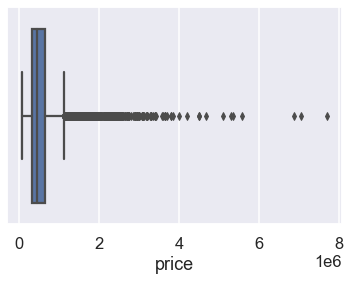

In [62]:
sns.boxplot(x=df['price'])

As we can see, the **'price'** column has a lot of outliers. We will remove the values that lie more than 3 standard deviations away from the mean, using z-score to identify them.

In [63]:
# identifying outliers based on z-score and removing.
df['z_score'] = np.abs(stats.zscore(df['price']))
df = (df.loc[df['z_score'] < 3])
df = df.drop('z_score', axis=1)

# checking new aggregate values
df['price'].describe()

count     21191.00
mean     507010.29
std      259462.21
min       78000.00
25%      320000.00
50%      447000.00
75%      627650.00
max     1640000.00
Name: price, dtype: float64

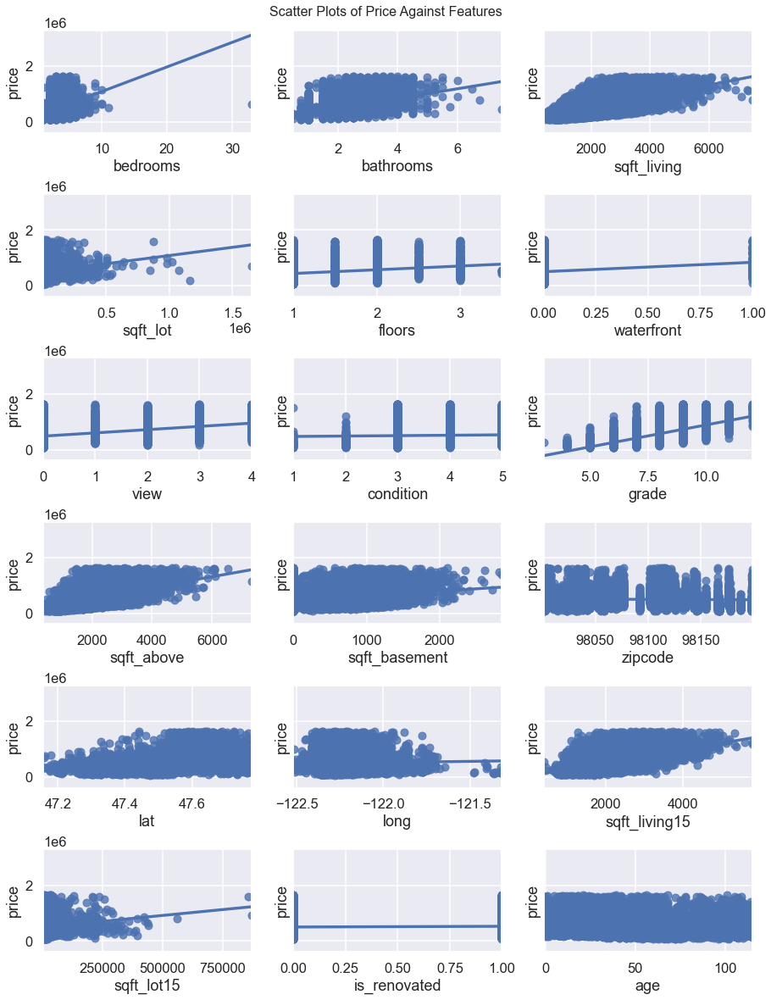

In [64]:
fig,ax = plt.subplots(figsize=(15,20), ncols=3, nrows=6, sharey=True)
fig.suptitle('Scatter Plots of Price Against Features', fontsize=16, y=.9)
cols = list(df.drop(['price','id'],axis=1).columns)
plt.subplots_adjust(hspace = 0.6)
for i, col in enumerate(cols):
    sns.regplot(x=col, y='price', ci=None, data=df, ax=ax[i//3][i%3])

A cursory examination of scatter plots of the independent variables suggests there may be some variables that would benefit from being scrubbed of outliers.

We can also see which categories we will probably want to treat as categorical from their distinctive distributions.

We can also check out which features have an apparent linear relationship with price, and which features have a more 'blobish', less defined relationship.

#### bedrooms

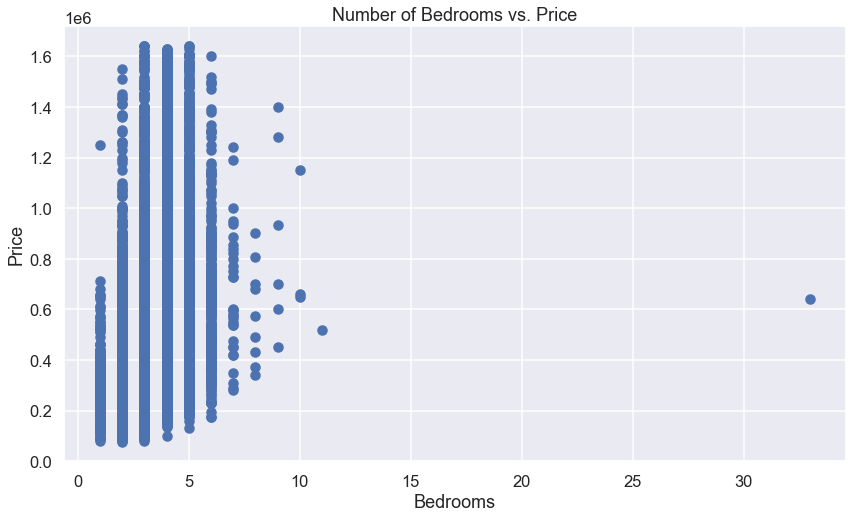

In [65]:
plt.figure(figsize=(14,8))
plt.scatter(df['bedrooms'], df['price'])
plt.xlabel('Bedrooms')
plt.ylabel('Price')
plt.title('Number of Bedrooms vs. Price');

In [66]:
# investigating outlier
df.loc[df['bedrooms'] > 15]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,zipcode,lat,long,sqft_living15,sqft_lot15,is_renovated,age
15856,2402100895,640000.00,33,1.75,1620,6000,1.00,0.00,0.00,5,7,1040,580,98103,47.69,-122.33,1330,4700,0,67


Given the sale price this house, and other variables (only 1.75 bathrooms for 33 bedrooms?) it is very likely that this is an entry error. Let's change this entry to the more likely 3 bedrooms the data reflects.

In [67]:
# replacing entry error
df['bedrooms'].replace({33 : 3}, inplace=True)

#### bathrooms

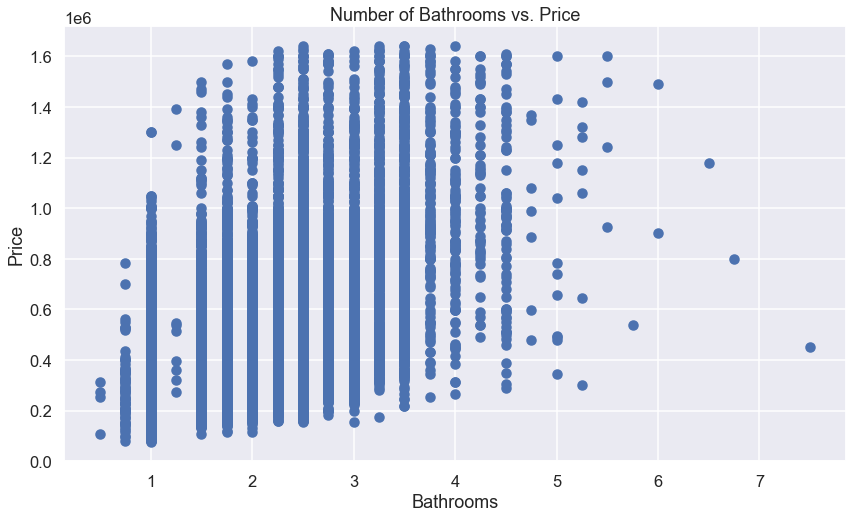

In [68]:
plt.figure(figsize=(14,8))
plt.scatter(df['bathrooms'], df['price'])
plt.xlabel('Bathrooms')
plt.ylabel('Price')
plt.title('Number of Bathrooms vs. Price');

In [69]:
# checking for outliers
# df['baths_z_score'] = np.abs(stats.zscore(df['bathrooms']))
# df['baths_z_score'].describe()

# df = (df.loc[df['baths_z_score'] < 3])
# df = df.drop('baths_z_score', axis=1)

#### sqft_living

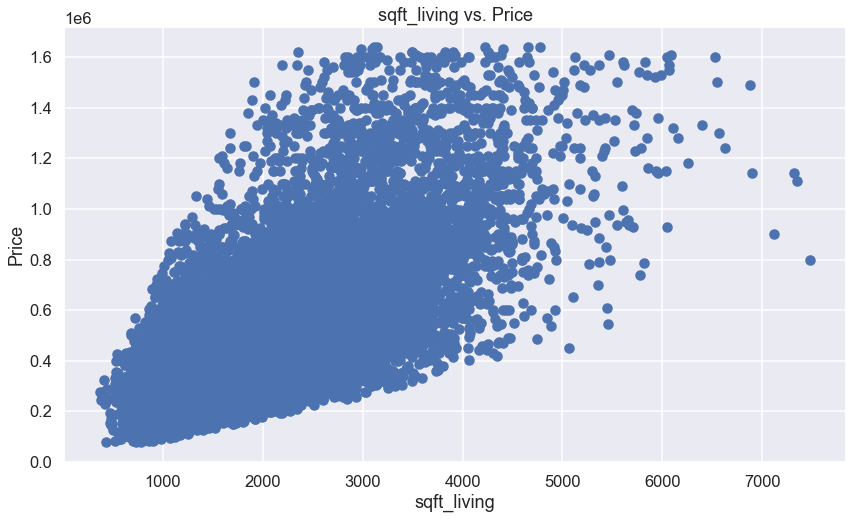

In [70]:
plt.figure(figsize=(14,8))
plt.scatter(df['sqft_living'], df['price'])
plt.xlabel('sqft_living')
plt.ylabel('Price')
plt.title('sqft_living vs. Price');

In [71]:
# removing outliers
# df['sqft_living_z'] = np.abs(stats.zscore(df['sqft_living']))
# df = (df.loc[df['sqft_living_z'] < 3])
# df = df.drop('sqft_living_z', axis=1)

#### sqft_lot

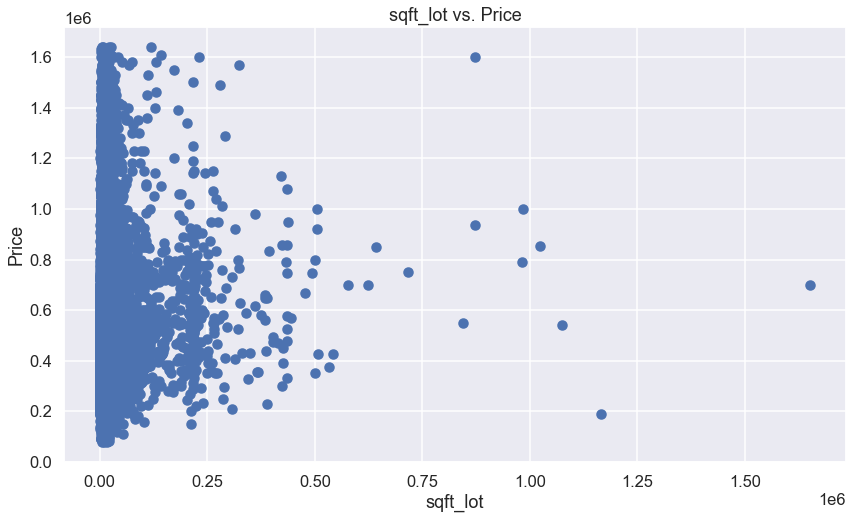

In [72]:
plt.figure(figsize=(14,8))
plt.scatter(df['sqft_lot'], df['price'])
plt.xlabel('sqft_lot')
plt.ylabel('Price')
plt.title('sqft_lot vs. Price');

Looking at the scatter plot of **'sqft_lot'** it is hard to imagine a linear relationship between the variables. We will keep it in our regression for the time being, but this is a strong candidate for removal.

In [73]:
# removing outiers
# df['sqft_lot_z'] = np.abs(stats.zscore(df['sqft_lot']))
# df = (df.loc[df['sqft_lot_z'] < 3])
# df = df.drop('sqft_lot_z', axis=1)

#### sqft_above

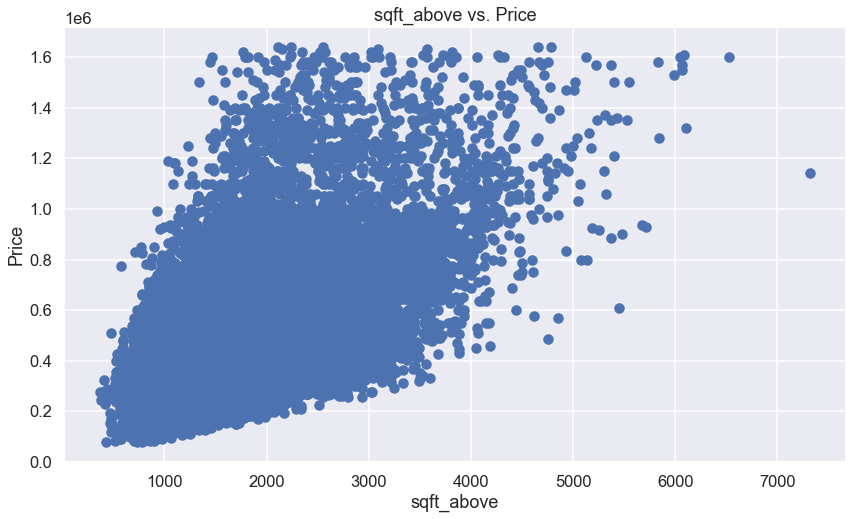

In [74]:
plt.figure(figsize=(14,8))
plt.scatter(df['sqft_above'], df['price'])
plt.xlabel('sqft_above')
plt.ylabel('Price')
plt.title('sqft_above vs. Price');

In [75]:
# removing outliers
# df['sqft_above_z'] = np.abs(stats.zscore(df['sqft_above']))
# df = (df.loc[df['sqft_above_z'] < 3])
# df = df.drop('sqft_above_z', axis=1)

#### sqft_basement

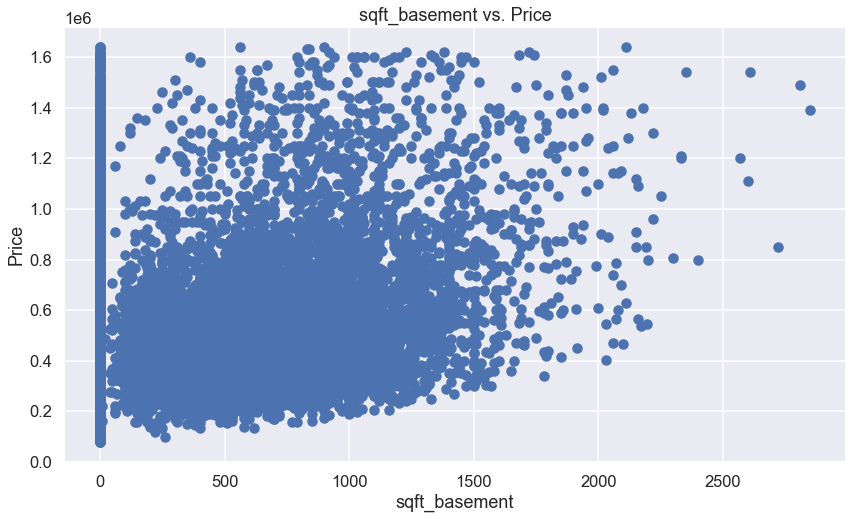

In [76]:
plt.figure(figsize=(14,8))
plt.scatter(df['sqft_basement'], df['price'])
plt.xlabel('sqft_basement')
plt.ylabel('Price')
plt.title('sqft_basement vs. Price');

This variable is complicated by the presence of so many entries with 0. Whether or not so many houses really have no basement, or if 0 is being used as a placeholder value is unknown. Couple with the correlation between this and **'sqft_living'** and **'sqft_above'**, this variable is ripe for dropping.

In [77]:
# removing outliers
# df['sqft_basement_z'] = np.abs(stats.zscore(df['sqft_basement']))
# df = (df.loc[df['sqft_basement_z'] < 3])
# df = df.drop('sqft_basement_z', axis=1)

#### sqft_living15

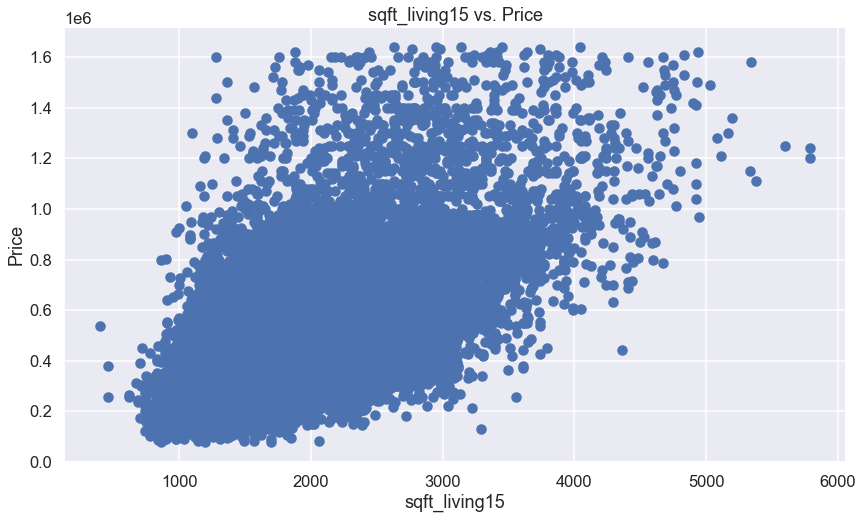

In [78]:
plt.figure(figsize=(14,8))
plt.scatter(df['sqft_living15'], df['price'])
plt.xlabel('sqft_living15')
plt.ylabel('Price')
plt.title('sqft_living15 vs. Price');

In [79]:
# removing outliers
# df['sqft_living15_z'] = np.abs(stats.zscore(df['sqft_living15']))
# df = (df.loc[df['sqft_living15_z'] < 3])
# df = df.drop('sqft_living15_z', axis=1)

#### sqft_lot15

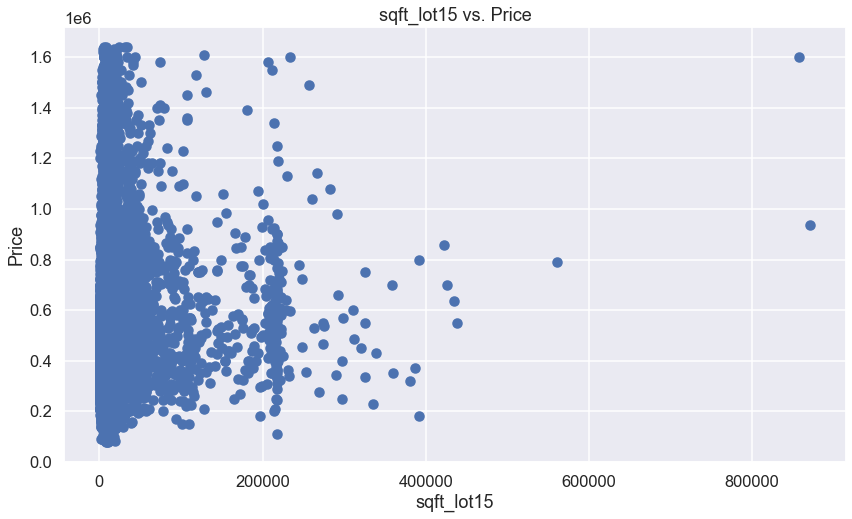

In [80]:
plt.figure(figsize=(14,8))
plt.scatter(df['sqft_lot15'], df['price'])
plt.xlabel('sqft_lot15')
plt.ylabel('Price')
plt.title('sqft_lot15 vs. Price');

In [81]:
# remvoving outliers
# df['sqft_lot15_z'] = np.abs(stats.zscore(df['sqft_lot15']))
# df = (df.loc[df['sqft_lot15_z'] < 3])
# df = df.drop('sqft_lot15_z', axis=1)

Unsurprisingly, given its similarity to **'sqft_lot'**, **'sqft_lot15'** lacks a clear linear relationship with **'price'**. It's on the chopping block.

In [82]:
df.shape

(21191, 20)

After removing outliers from our data set, we have culled 1639 entries.

### Relevancy

Deciding which columns are relevant to a regression model is subjective. Intuitively, a column like **'id'**, which is a unique identifier of a particular house will not have any sort of linear relationship to house price, and can be eliminated.

Creating a heat map of the variables will help us decide which features can be discarded, and give us an inking of which features may interfere with our modeling due to multicollinearity. I will also run a **variance inflation factor** to test for multicollinearity.


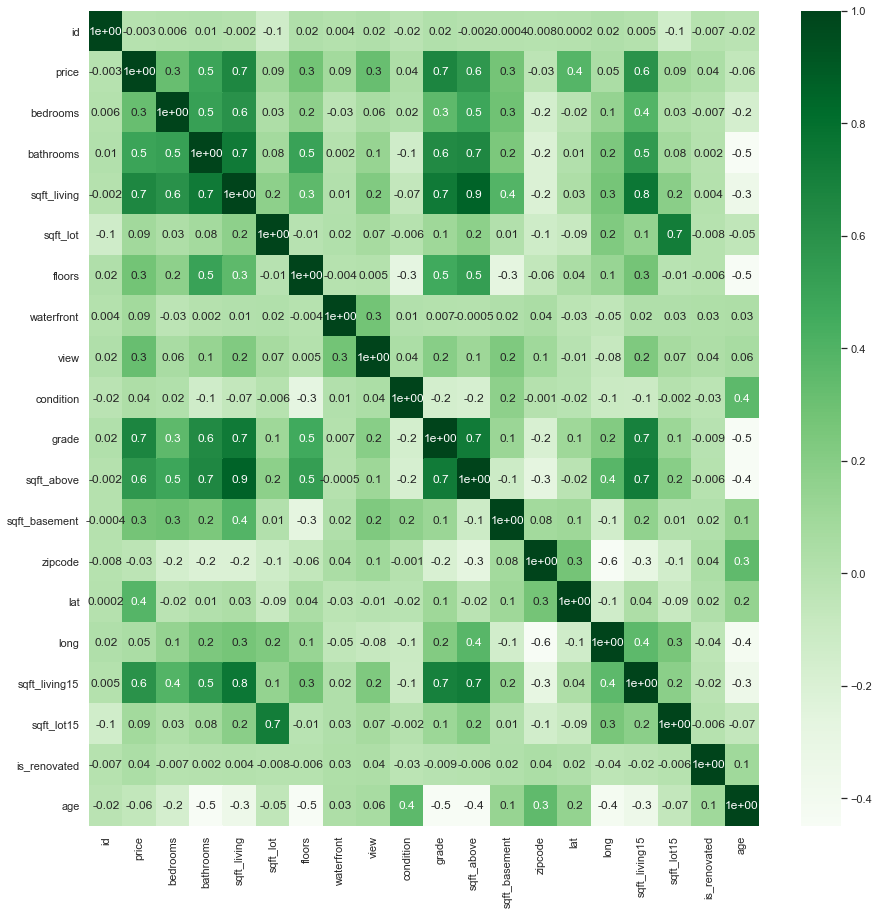

In [83]:
# plot a heatmap using seaborn
sns. set(font_scale=1)
fig, ax = plt.subplots(figsize=(15,15))
ax = sns.heatmap(data=df.corr(), annot=True, robust=True, fmt='.1', cmap="Greens")
plt.tight_layout;

Right off the bat, we can see that **'price'** most strongly correlates, intuitively and perhaps unsurprisingly with **'sqft_living'**, and **'grade'**. 

Other significant correlations include:

**'bathrooms'** and **'sqft_living'**

**'sqft_living'** and **'sqft_above'**

**'sqft_living'** and **'grade'**

**'grade'** and **'sqft_above'**

The relationships between **'sqft_above'**, **'sqft_living'**, and **'sqft_basement'** suggest some strong collinearity and require further investigation. The relationship between **'sqft_living15'** and **'sqft_lot15'** also will be looked at closely.


#### VIF

In [84]:
vif_dct = {}

for i in range(len(df.columns)):
    vif = variance_inflation_factor(df.values, i).round(3)
    v = df.columns[i]
    vif_dct[v] = vif
    
vif_dct

{'id': 3.645,
 'price': 3.473,
 'bedrooms': 1.73,
 'bathrooms': 3.164,
 'sqft_living': 127.591,
 'sqft_lot': 2.106,
 'floors': 2.015,
 'waterfront': 1.097,
 'view': 1.304,
 'condition': 1.207,
 'grade': 3.621,
 'sqft_above': 108.15,
 'sqft_basement': 31.862,
 'zipcode': 0.489,
 'lat': 1.504,
 'long': 1.842,
 'sqft_living15': 2.902,
 'sqft_lot15': 2.146,
 'is_renovated': 1.021,
 'age': 2.285}

Generally we are looking really good here. With very few VIF values over 10, we can eliminate the multicollinearity and move forward with our processing.

In [85]:
df = df.drop(['sqft_basement'], axis=1)

vif_dct = {}

for i in range(len(df.columns)):
    vif = variance_inflation_factor(df.values, i).round(3)
    v = df.columns[i]
    vif_dct[v] = vif
    
vif_dct

{'id': 3.645,
 'price': 3.473,
 'bedrooms': 1.73,
 'bathrooms': 3.164,
 'sqft_living': 8.089,
 'sqft_lot': 2.105,
 'floors': 2.015,
 'waterfront': 1.097,
 'view': 1.304,
 'condition': 1.207,
 'grade': 3.621,
 'sqft_above': 6.314,
 'zipcode': 0.489,
 'lat': 1.504,
 'long': 1.842,
 'sqft_living15': 2.901,
 'sqft_lot15': 2.146,
 'is_renovated': 1.021,
 'age': 2.285}

By dropping the **'sqft_basement'** column we have eliminated any multicollinearity flags.

Let's go ahead and eliminate irrelevant variables (**'id', 'lat', 'long'**) and prepare our data for modeling via a trait-test split and encoding and scaling our training data.

## Train-Test Split, Encoding, and Scaling

In [86]:
continuous = ['bedrooms', 'bathrooms', 'floors',
              'condition', 'grade', 'sqft_living',
              'sqft_lot', 'sqft_above', 
              'sqft_living15', 'sqft_lot15', 'age']
categorical = [ 'waterfront', 'view', 'zipcode', 'is_renovated']

A note on categorical vs. continuous:

Variables that have no relation to a linear value and are non-ordinal (ie. **'zipcode'**) and those that are binary values, I have treated as categorical.

Variables that might be considered categorical, but that I have chosen to keep as continuous are generally ordinal and whose order has an implicit value associated with it (ie. **'grade.'**)

In [87]:
preprocessed = df.drop(['id', 'lat', 'long'], axis=1)

y = preprocessed['price']
X = preprocessed.drop('price', axis=1)

#### tt_split

In [88]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=11)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((15893, 15), (15893,), (5298, 15), (5298,))

#### scaling

In [90]:
# scaling the X_train continuous data
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train[continuous]),
                              columns=X_train[continuous].columns)

# only transform the test data
X_test_scaled = pd.DataFrame(scaler.transform(X_test[continuous]),
                              columns=X_test[continuous].columns)

#### encoding

In [91]:
# instantiating ohe
ohe = OneHotEncoder(categories='auto', drop='first', sparse=False)

# fit_transforming categorical columns of X_train
feature_arr_train = ohe.fit_transform(X_train[['waterfront', 'view', 'zipcode', 'is_renovated']
])

# get feature names for assigning to columns
feature_labels = ohe.get_feature_names(categorical)
feature_labels = np.array(feature_labels).ravel()
features_train = pd.DataFrame(feature_arr_train, columns=feature_labels)

In [92]:
# transforming categorical columns of X_test
feature_arr_test = ohe.transform(X_test[['waterfront', 'view', 'zipcode', 'is_renovated']
])

# get feature names for assigning to columns
feature_labels = ohe.get_feature_names(categorical)
feature_labels = np.array(feature_labels).ravel()
features_test = pd.DataFrame(feature_arr_test, columns=feature_labels)

## Modeling

### Baseline

In [94]:
X_train = X_train_scaled.merge(features_train, left_index=True, right_index=True)
X_train_int = sm.add_constant(X_train)

X_train_int.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)

model = sm.OLS(y_train ,X_train_int).fit()
model.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                      Results: Ordinary least squares
============================================================================
Model:                  OLS                Adj. R-squared:       0.833      
Dependent Variable:     price              AIC:                  412956.3702
Date:                   2021-09-27 12:43   BIC:                  413623.9763
No. Observations:       15893              Log-Likelihood:       -2.0639e+05
Df Model:               86                 F-statistic:          919.5      
Df Residuals:           15806              Prob (F-statistic):   0.00       
R-squared:              0.833              Scale:                1.1211e+10 
----------------------------------------------------------------------------
                  Coef.     Std.Err.     t    P>|t|     [0.025      0.975]  
----------------------------------------------------------------------------
const          319487.6601  6515.7187 49.0334 0.0000 306716.1081 332259.2121
bedrooms        -8248.3375  1120.8574 -7.3590 0.0000 -10445.3459  -6051.3291
bathrooms       12713.9865  1496.0389  8.4984 0.0000   9781.5796  15646.3934
floors         -11089.9352  1320.8590 -8.3960 0.0000 -13678.9695  -8500.9010
condition       13714.4172   950.9544 14.4217 0.0000  11850.4380  15578.3963
grade           60522.6961  1571.2336 38.5192 0.0000  57442.8990  63602.4933
sqft_living     64959.3829  2371.0486 27.3969 0.0000  60311.8571  69606.9086
sqft_lot         9584.1297  1249.0736  7.6730 0.0000   7135.8030  12032.4564
sqft_above      42678.0536  2218.5760 19.2367 0.0000  38329.3915  47026.7156
sqft_living15   21085.6394  1523.1821 13.8432 0.0000  18100.0286  24071.2501
sqft_lot15        -81.0956  1296.0885 -0.0626 0.9501  -2621.5770   2459.3857
age             20361.8795  1410.0429 14.4406 0.0000  17598.0346  23125.7244
waterfront_1.0 194985.3381 14033.7122 13.8941 0.0000 167477.6613 222493.0149
view_1.0        63551.3670  7054.1294  9.0091 0.0000  49724.4686  77378.2654
view_2.0        62326.8274  4391.2381 14.1935 0.0000  53719.4998  70934.1551
view_3.0       127555.6567  6221.8475 20.5013 0.0000 115360.1258 139751.1877
view_4.0       233807.1566  9563.6221 24.4476 0.0000 215061.3662 252552.9469
zipcode_98002   12440.8908 10912.2007  1.1401 0.2543  -8948.2675  33830.0490
zipcode_98003   -9977.7889  9744.8657 -1.0239 0.3059 -29078.8374   9123.2595
zipcode_98004  603808.2076 10511.0537 57.4451 0.0000 583205.3432 624411.0719
zipcode_98005  319021.4710 11575.2555 27.5606 0.0000 296332.6497 341710.2923
zipcode_98006  272813.3014  8714.6784 31.3050 0.0000 255731.5375 289895.0654
zipcode_98007  251398.6617 12190.5388 20.6224 0.0000 227503.8150 275293.5085
zipcode_98008  245016.5003  9726.6412 25.1902 0.0000 225951.1739 264081.8266
zipcode_98010   87490.0047 13552.5597  6.4556 0.0000  60925.4416 114054.5678
zipcode_98011  132986.7066 10858.0374 12.2478 0.0000 111703.7146 154269.6987
zipcode_98014  113215.8106 13111.9315  8.6346 0.0000  87514.9291 138916.6921
zipcode_98019  100966.7521 11063.2721  9.1263 0.0000  79281.4767 122652.0274
zipcode_98022   -4685.3979 10420.2012 -0.4496 0.6530 -25110.1811  15739.3853
zipcode_98023  -26369.7540  8526.1435 -3.0928 0.0020 -43081.9680  -9657.5399
zipcode_98024  160542.6909 15432.1757 10.4031 0.0000 130293.8660 190791.5158
zipcode_98027  178976.7324  8943.5155 20.0119 0.0000 161446.4217 196507.0431
zipcode_98028  129716.1960  9576.0579 13.5459 0.0000 110946.0300 148486.3619
zipcode_98029  215655.4869  9369.4742 23.0168 0.0000 197290.2485 234020.7252
zipcode_98030    1427.0809 10033.2156  0.1422 0.8869 -18239.1663  21093.3282
zipcode_98031    5241.6559  9900.3181  0.5294 0.5965 -14164.0969  24647.4088
zipcode_98032     516.4734 12705.1260  0.0407 0.9676 -24387.0231  25419.9699
zipcode_98033  353999.2663  8900.8079 39.7716 0.0000 336552.6674 371445.8652
zipcode_98034  186815.8693  8343.4217 22.3908 0.0000 170461.8110 203169.9277
zipcode_98038   33135.5438  8197.6636  4.0421 0

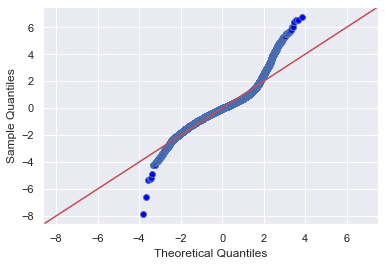

In [95]:
residuals = model.resid
fig = sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)

Our first attempt at modeling the preprocessed data set has an adjusted **R2** value of **.834**. The **'sqft_lot15'** variable has a p-value of .93, suggesting a 93% chance that the coefficient is actually 0. We will drop this variable in subsequent models. The vast majority of the encoded zip codes have a p-value lower than .05, that we can confidently assert statistical significance.

Our biggest issue with this model is that the residuals do not pass our assumption of normality, as seen in the QQ-plot above.

In [96]:
X_test = X_test_scaled.merge(features_test, left_index=True, right_index=True)

linreg = LinearRegression()
linreg.fit(X_train, y_train)
linreg.fit(X_test, y_test)


# checking predictions from test against train
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

In [99]:
metrics_dct = {}

for split, y_pred in [('train', y_train_pred), ('test', y_test_pred)]:
    y_true = y_train.copy() if split == 'train' else y_test.copy()
    
    r2 = r2_score(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    split_dct = {
        'r2': r2,
        'mse': mse,
        'mae': mae,
        'rmse': np.sqrt(mse)
    }
    metrics_dct[split] = split_dct
    
metrics_dct

{'train': {'r2': 0.8287201095020214,
  'mse': 11464521424.207804,
  'mae': 74676.43064639514,
  'rmse': 107072.5054540511},
 'test': {'r2': 0.8465324299782605,
  'mse': 10507380009.786978,
  'mae': 73071.15838433133,
  'rmse': 102505.51209465263}}

**Describe difference between train and test models .**Let's continue to refine it and see if we can improve the normality of our residuals without sacrificing R2.

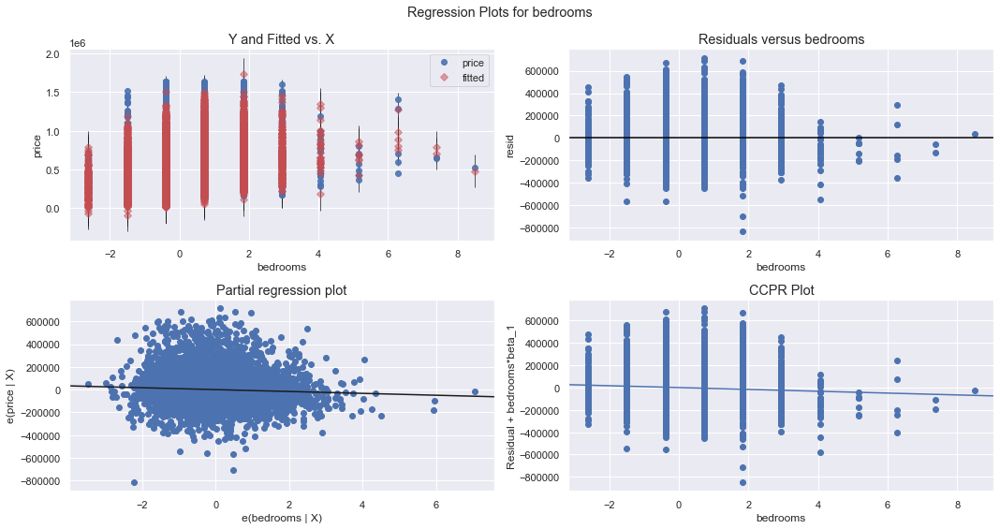

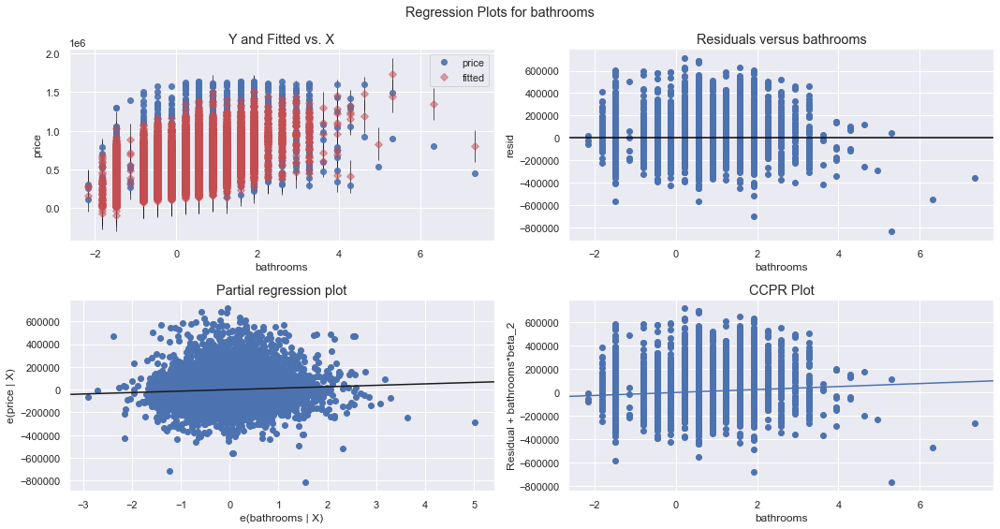

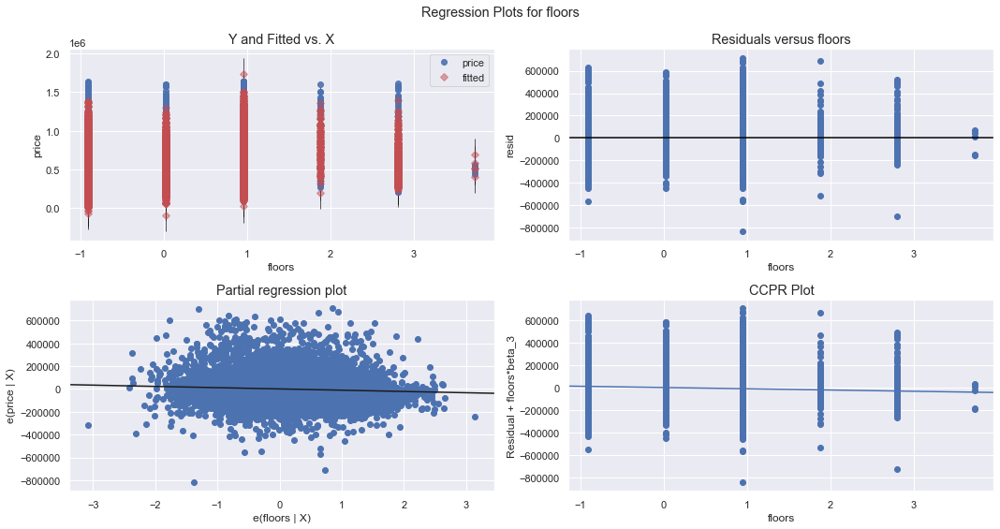

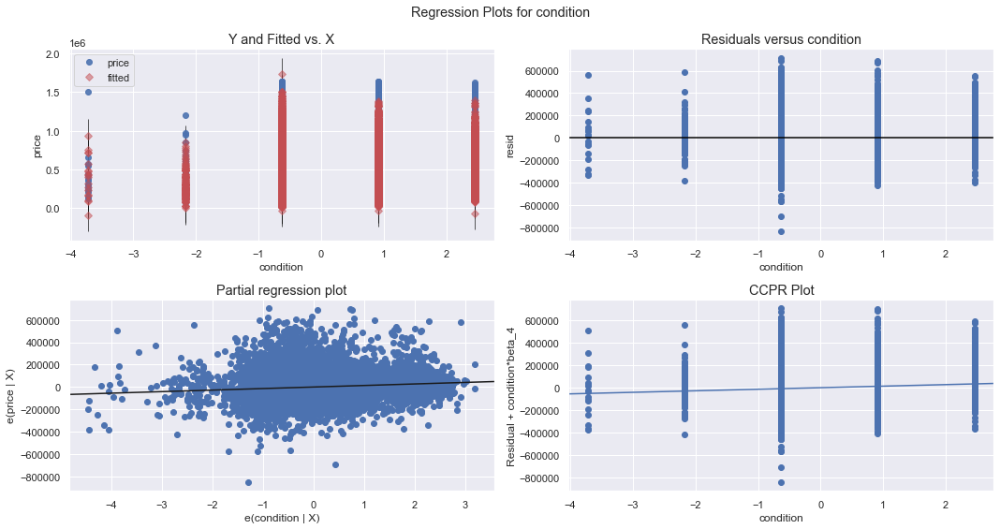

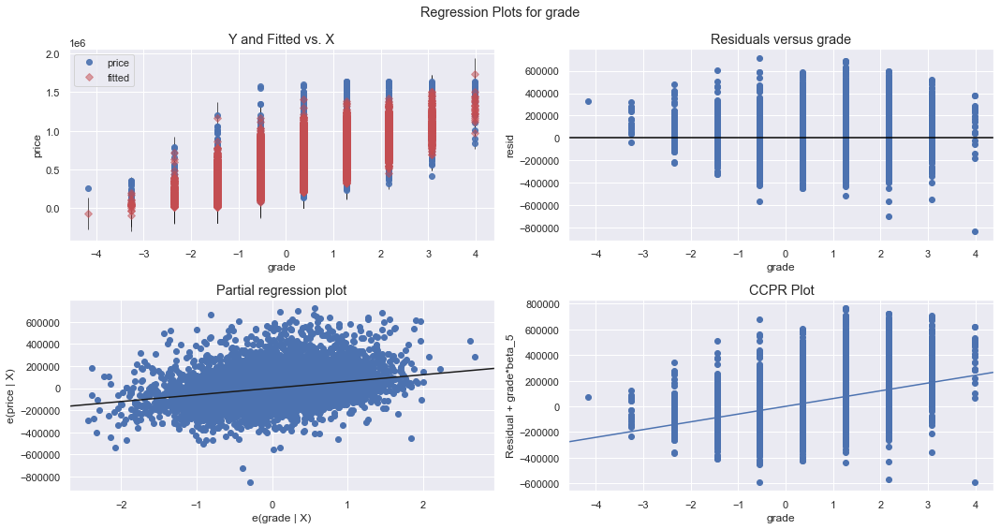

...

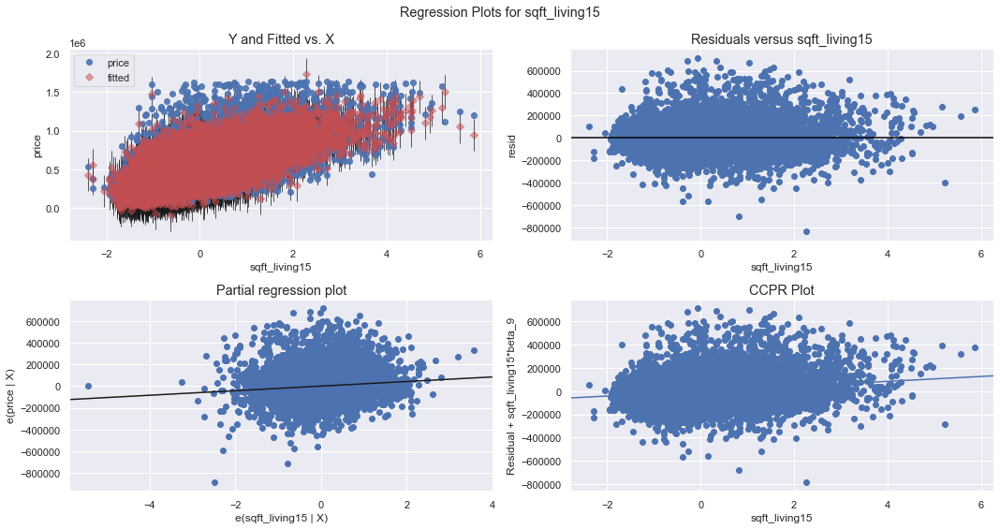

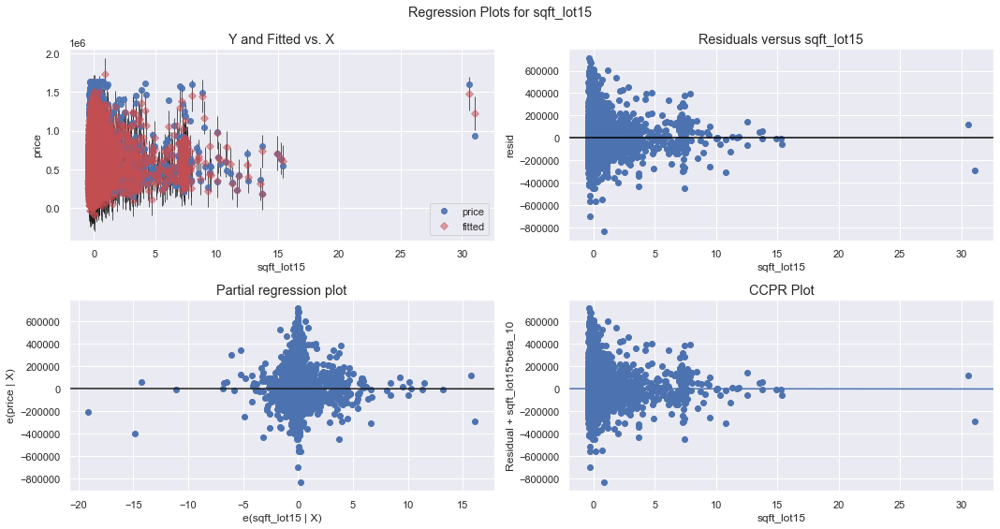

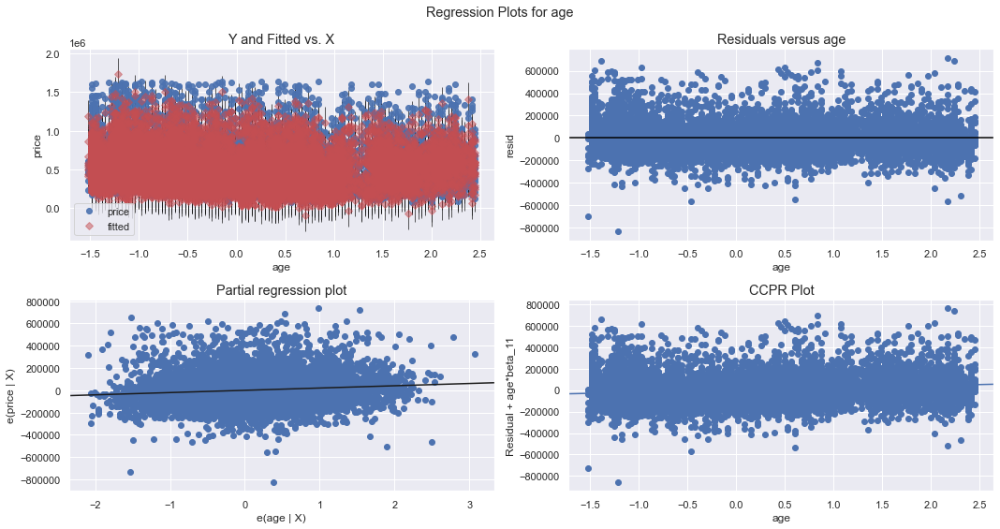

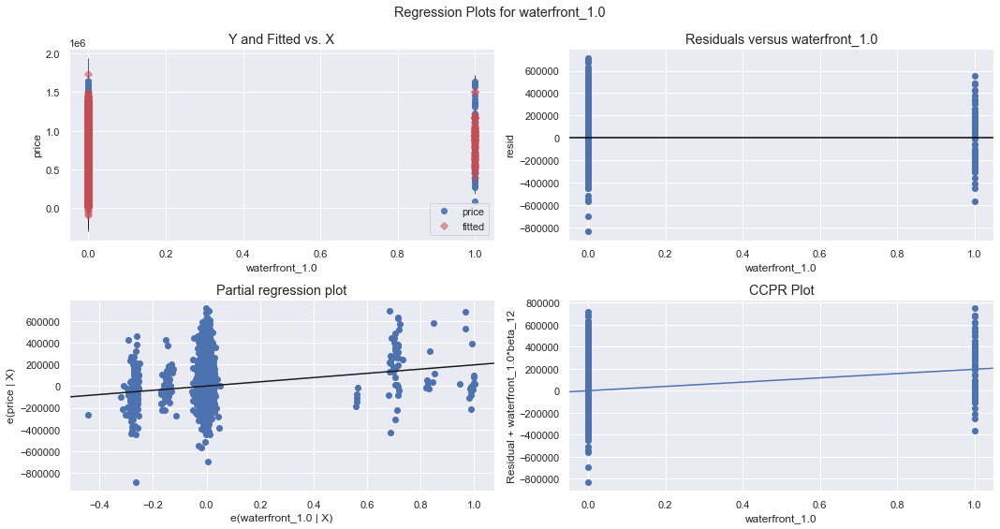

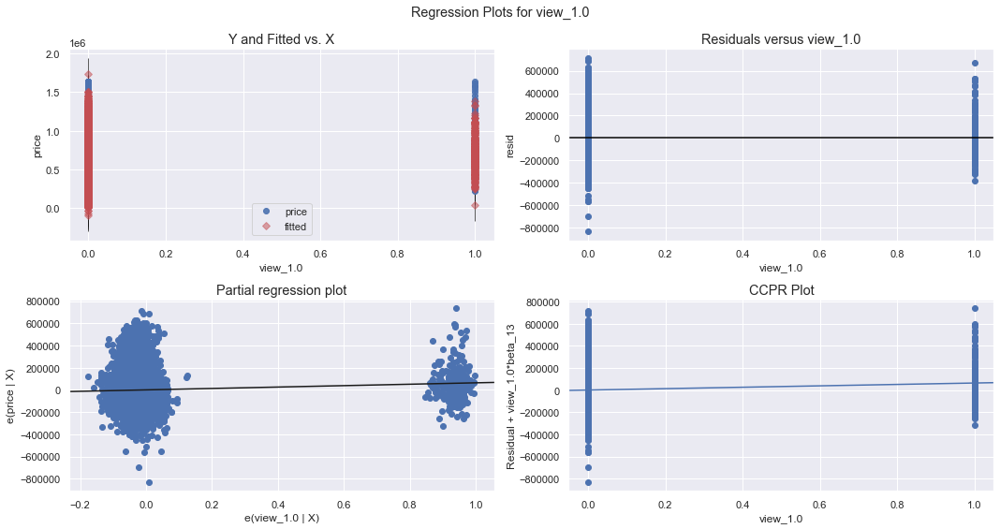

KeyboardInterrupt: 

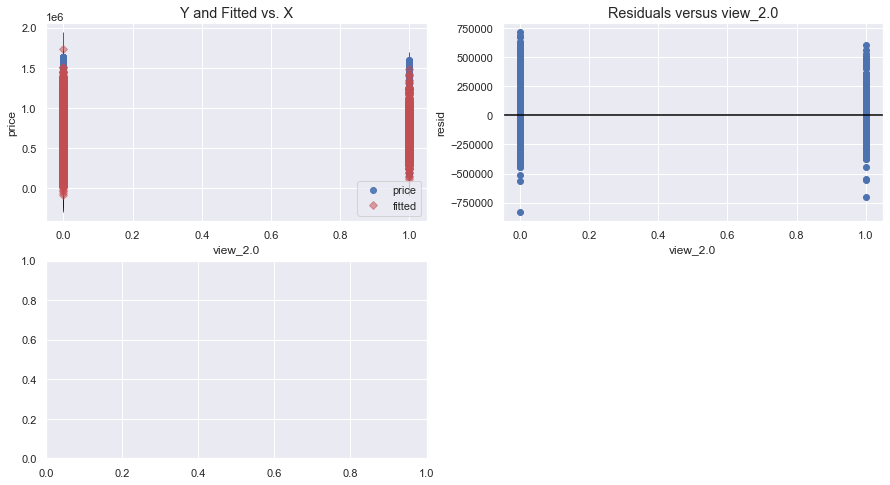

In [106]:
for col in X_train.columns:

    fig = plt.figure(figsize=(15,8))
    fig = sm.graphics.plot_regress_exog(model, col, fig=fig)
    plt.show()

The distribution of our residuals, checked for homoscedasticity look good, with the exception of **'sqft_lot'** and **'sqft_lot15'**. Let's remove both of these columns from our next model.

### Iteration 1

In [101]:
X_train_2 = X_train_scaled.drop(['sqft_lot', 'sqft_lot15'],
                                axis=1).merge(features,
                                              left_index=True, right_index=True)

X_train_2_int = sm.add_constant(X_train_2)

X_train_2_int.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)

model_2 = sm.OLS(y_train ,X_train_2_int).fit()
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.831
Method:                 Least Squares   F-statistic:                     933.1
Date:                Mon, 27 Sep 2021   Prob (F-statistic):               0.00
Time:                        13:07:19   Log-Likelihood:            -2.0645e+05
No. Observations:               15893   AIC:                         4.131e+05
Df Residuals:                   15808   BIC:                         4.137e+05
Df Model:                          84                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const           3.201e+05   6539.103     48.957      0.000    3.07e+05    3.33e+05
bedrooms       -8863.9055   1122.294     -7.898      0.000   -1.11e+04   -6664.081
bathrooms       1.257e+04   1501.328      8.371      0.000    9625.370    1.55e+04
floors         -1.171e+04   1323.985     -8.846      0.000   -1.43e+04   -9116.251
condition       1.356e+04    954.345     14.207      0.000    1.17e+04    1.54e+04
grade           6.056e+04   1576.766     38.409      0.000    5.75e+04    6.37e+04
sqft_living     6.624e+04   2373.060     27.915      0.000    6.16e+04    7.09e+04
sqft_above      4.365e+04   2225.441     19.612      0.000    3.93e+04     4.8e+04
sqft_living15   2.114e+04   1526.980     13.847      0.000    1.82e+04    2.41e+04
age             2.123e+04   1412.952     15.028      0.000    1.85e+04     2.4e+04
waterfront_1.0  1.814e+05   1.39e+04     13.048      0.000    1.54e+05    2.09e+05
view_1.0        6.385e+04   7078.985      9.020      0.000       5e+04    7.77e+04
view_2.0        6.322e+04   4406.600     14.346      0.000    5.46e+04    7.19e+04
view_3.0        1.308e+05   6237.603     20.965      0.000    1.19e+05    1.43e+05
view_4.0        2.368e+05   9608.011     24.647      0.000    2.18e+05    2.56e+05
zipcode_98002   1.087e+04    1.1e+04      0.992      0.321   -1.06e+04    3.23e+04
zipcode_98003  -1.136e+04   9779.823     -1.161      0.245   -3.05e+04    7810.538
zipcode_98004   6.016e+05   1.05e+04     57.033      0.000    5.81e+05    6.22e+05
zipcode_98005   3.181e+05   1.16e+04     27.382      0.000    2.95e+05    3.41e+05
zipcode_98006   2.697e+05   8742.661     30.850      0.000    2.53e+05    2.87e+05
zipcode_98007   2.496e+05   1.22e+04     20.402      0.000    2.26e+05    2.74e+05
zipcode_98008   2.421e+05   9760.693     24.806      0.000    2.23e+05    2.61e+05
zipcode_98010   9.616e+04   1.36e+04      7.095      0.000    6.96e+04    1.23e+05
zipcode_98011    1.31e+05   1.09e+04     12.025      0.000     1.1e+05    1.52e+05
zipcode_98014   1.322e+05   1.29e+04     10.237      0.000    1.07e+05    1.57e+05
zipcode_98019   1.064e+05   1.11e+04      9.606      0.000    8.47e+04    1.28e+05
zipcode_98022   9050.7276   1.04e+04      0.874      0.382   -1.12e+04    2.93e+04
zipcode_98023  -2.876e+04   8557.576     -3.361      0.001   -4.55e+04    -1.2e+04
zipcode_98024   1.781e+05   1.53e+04     11.635      0.000    1.48e+05    2.08e+05
zipcode_98027   1.822e+05   8960.086     20.336      0.000    1.65e+05       2e+05
zipcode_98028   1.276e+05   9611.020     13.276      0.000    1.09e+05    1.46e+05
zipcode_98029   2.138e+05   9401.948     22.742      0.000    1.95e+05    2.32e+05
zipcode_98030    320.2055   1.01e+04      0.032      0.975   -1.94e+04    2.01e+04
zipcode_98031   3751.7777   9936.901      0.378      0.706   -1.57e+04    2.32e+04
zipcode_9803

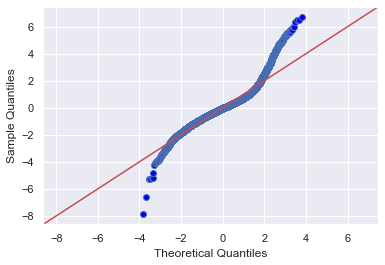

In [102]:
residuals = model_2.resid
fig = sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)

This iteration of our model shows improved normality of residuals, and a very small reduction in R2. Since there are no more p-values that we should use as a basis for exclusion, we will attempt to engineer better normality by trial and error.

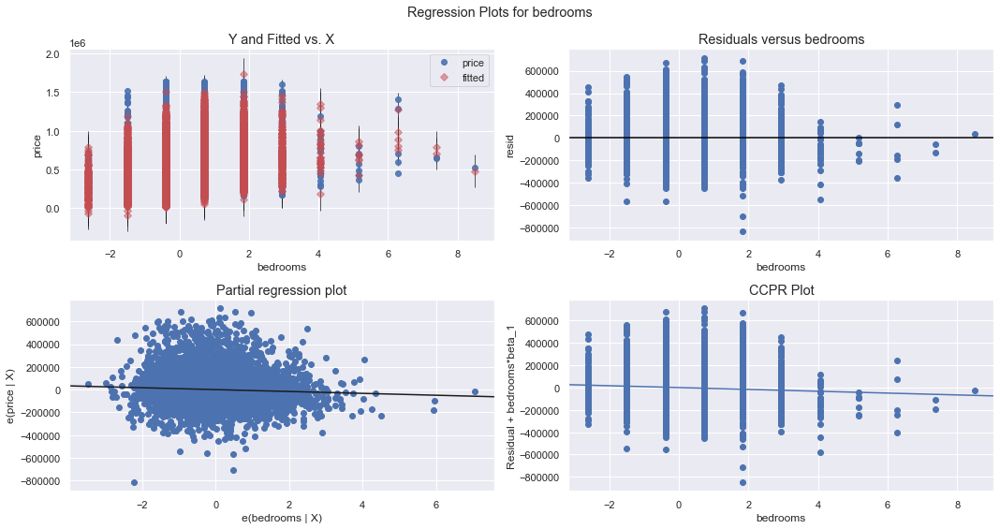

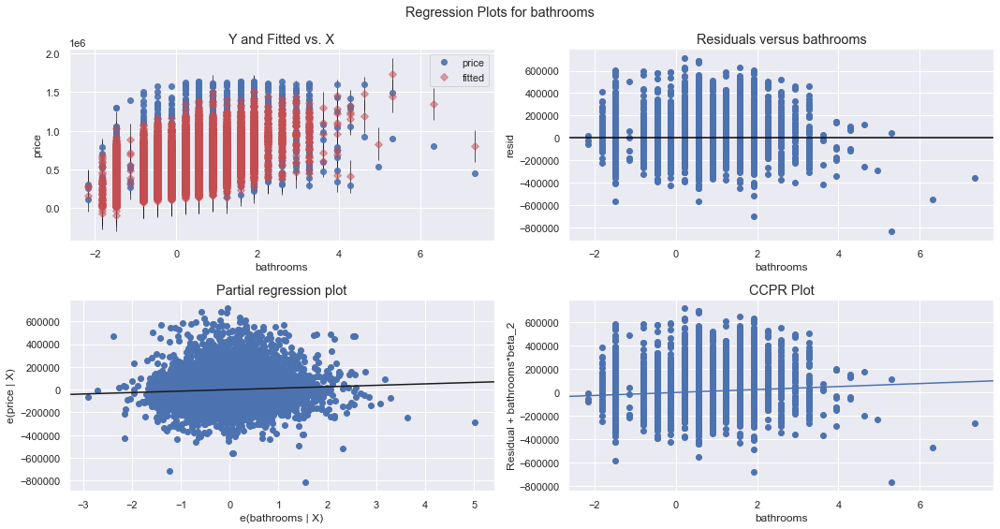

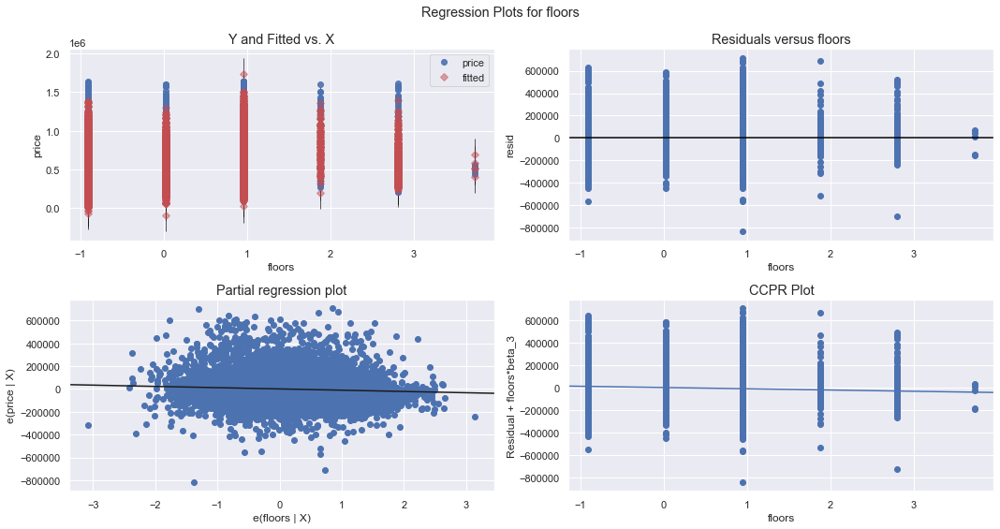

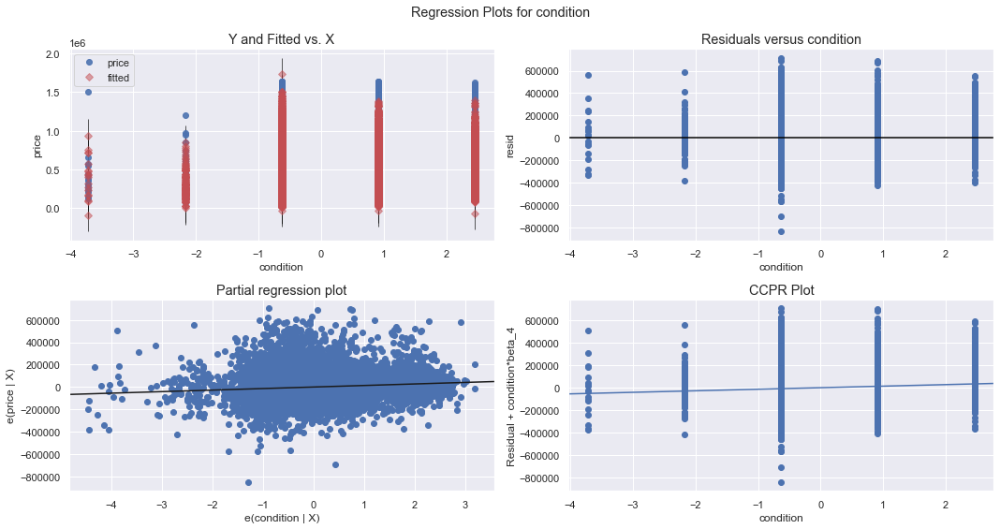

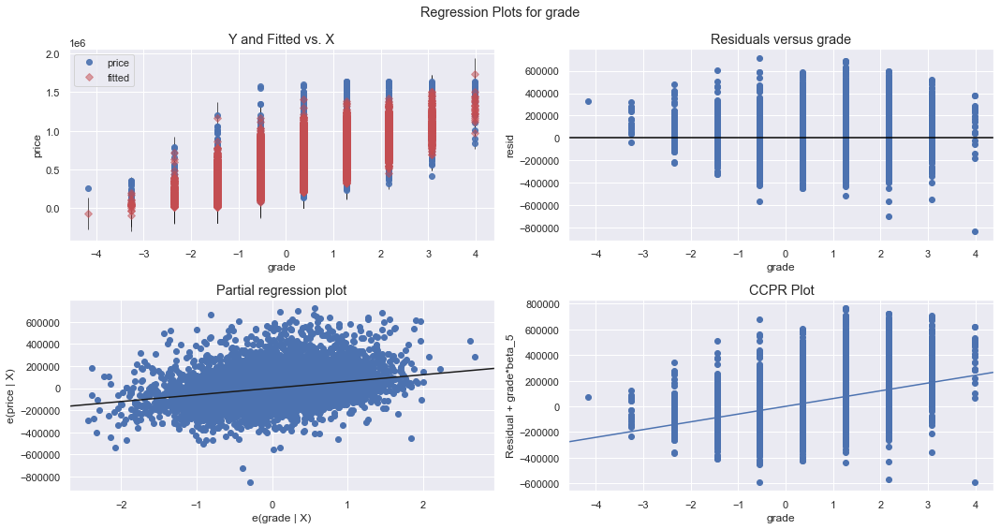

...

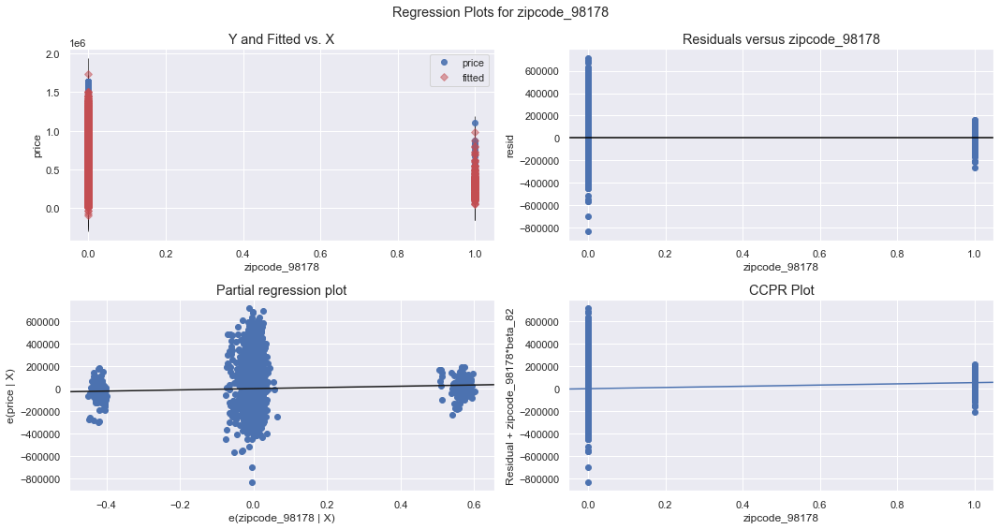

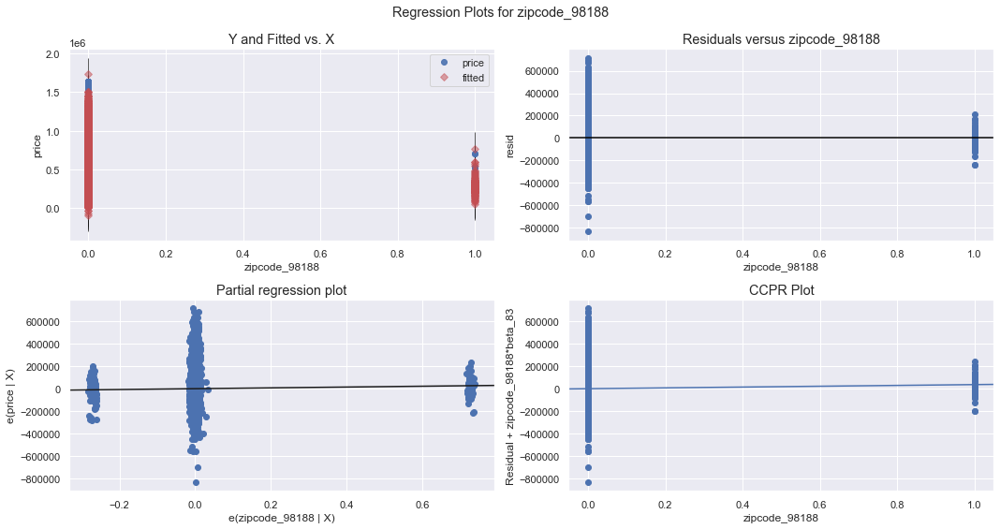

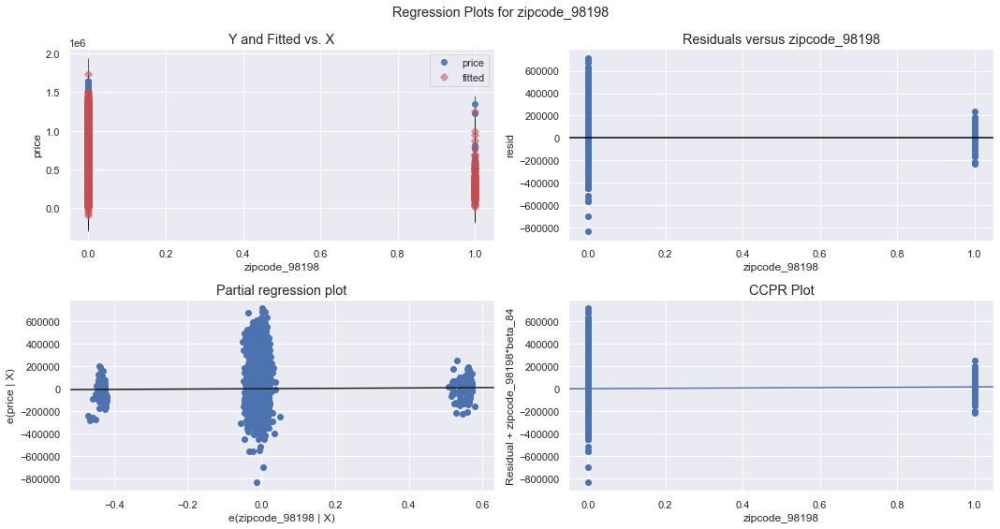

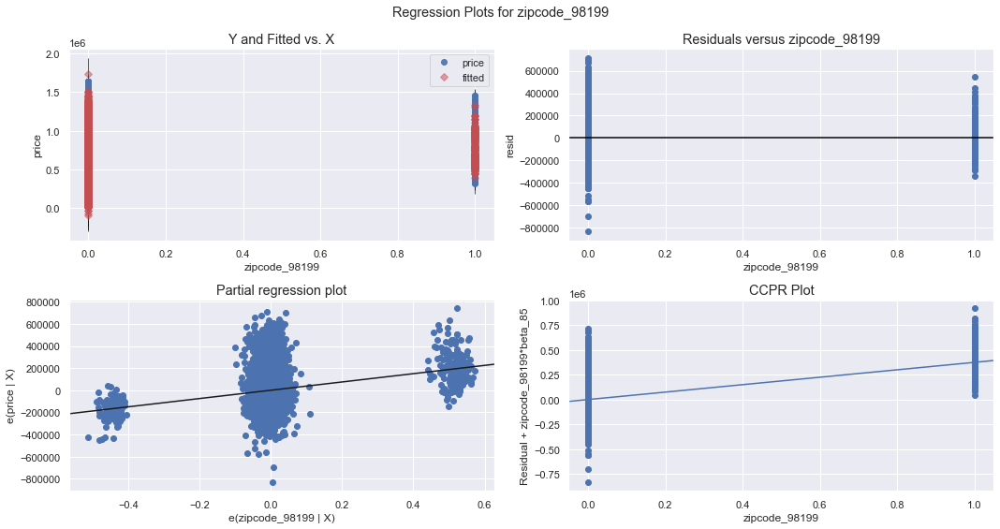

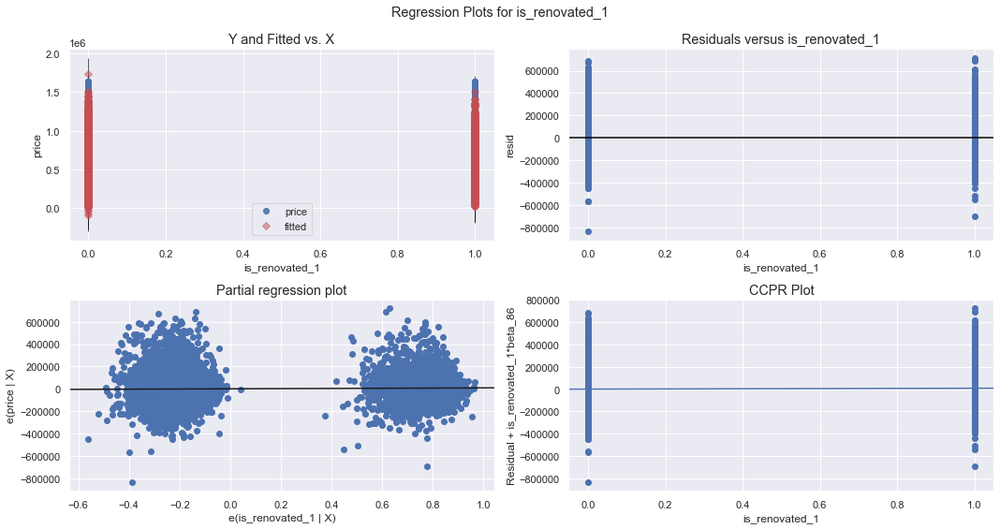

In [107]:
for col in X_train_2.columns:

    fig = plt.figure(figsize=(15,8))
    fig = sm.graphics.plot_regress_exog(model, col, fig=fig)
    plt.show()

In [ ]:
X_train_int_3 = sm.add_constant(
    X_train_scaled.drop(['sqft_lot', 'bedrooms'], axis=1).merge(features, left_index=True, right_index=True))

X_train_int_3.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)

model_3 = sm.OLS(y_train ,X_train_int_3).fit()
model_3.summary()

In [ ]:
from sklearn.metrics import mean_absolute_error

# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
# fit the model
model = LinearRegression()
model.fit(X_train, y_train)
# evaluate the model
yhat = model.predict(X_test)
# evaluate predictions
mae = mean_absolute_error(y_test, yhat)
print('MAE: %.3f' % mae)